# Helmet - 3-model SAHI (minimal, Ultralytics guide)

Snippet from https://docs.ultralytics.com/guides/sahi-tiled-inference - `AutoDetectionModel` + `get_sliced_prediction`. No GREEDYNMM/IOS, no match_boxes.

| weight | helmet id |
|---|---|
| `data/results_yolov8n_100e/kaggle/working/runs/detect/train/weights/best.pt` (yolov8n-CSS) | `0:Hardhat` |
| `runs/detect/yolo26s_Altec_PPE_100e/weights/best.pt` (AltecPPE) | `4:Helmet`+`8:helmet` |
| `runs/detect/yolo26s_merged_100e/weights/best.pt` (merged) | `1:helmet` |

Valid split: `data/css-data/valid` 114 images (all 640x640). SAHI `slice 256 overlap 0.2` as in the guide.


## 1 - Setup


In [51]:
from pathlib import Path
import random, time
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, cv2
from PIL import Image
from ultralytics import YOLO
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

sns.set_theme(style="whitegrid")
random.seed(42)

try:
    REPO_ROOT = Path(__file__).resolve().parents[2]
except NameError:
    cur = Path.cwd()
    REPO_ROOT = cur
    for cand in [cur, cur.parent, cur.parent.parent]:
        if (cand / "YOLO8.ipynb").exists() or (cand / ".git").exists():
            REPO_ROOT = cand; break
print("REPO_ROOT:", REPO_ROOT)
print("ultralytics:", __import__("ultralytics").__version__)
print("sahi:", __import__("sahi").__version__)


REPO_ROOT: e:\work\P0-safety
ultralytics: 8.4.127
sahi: 0.12.6


## 2 - Data - valid 114


In [52]:
VALID_DIR = REPO_ROOT / "data" / "css-data" / "valid"
IMGS = sorted((VALID_DIR / "images").glob("*.jpg"))
print(f"valid images: {len(IMGS)}  exists={VALID_DIR.exists()}")
if IMGS:
    with Image.open(IMGS[0]) as im:
        print("example size:", im.size, IMGS[0].name[:40])


valid images: 114  exists=True
example size: (640, 640) -1079-_png_jpg.rf.19092a3937930012f9fd9c


## 3 - Models


In [53]:
MODELS = [
    ("yolov8n-CSS", REPO_ROOT/"data/results_yolov8n_100e/kaggle/working/runs/detect/train/weights/best.pt", [0]),
    ("yolo26s-AltecPPE", REPO_ROOT/"runs/detect/yolo26s_Altec_PPE_100e/weights/best.pt", [4, 8]),
    ("yolo26s-merged", REPO_ROOT/"runs/detect/yolo26s_merged_100e/weights/best.pt", [1]),
]
for name, p, keep in MODELS:
    print(f"{name:18s} {p} exists={p.exists()} keep={keep}  -> ", end="")
    if p.exists():
        print(YOLO(str(p)).names)


yolov8n-CSS        e:\work\P0-safety\data\results_yolov8n_100e\kaggle\working\runs\detect\train\weights\best.pt exists=True keep=[0]  -> {0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}
yolo26s-AltecPPE   e:\work\P0-safety\runs\detect\yolo26s_Altec_PPE_100e\weights\best.pt exists=True keep=[4, 8]  -> {0: 'Face_masks', 1: 'Face_shield', 2: 'Glasses', 3: 'Gloves', 4: 'Helmet', 5: 'Safety_shoes', 6: 'Safety_vests', 7: 'glasses', 8: 'helmet'}
yolo26s-merged     e:\work\P0-safety\runs\detect\yolo26s_merged_100e\weights\best.pt exists=True keep=[1]  -> {0: 'person', 1: 'helmet', 2: 'gloves', 3: 'boots', 4: 'vest', 5: 'no-helmet', 6: 'no-gloves', 7: 'no-boots', 8: 'no-vest'}


## 4 - SAHI - Ultralytics guide snippet

https://docs.ultralytics.com/guides/sahi-tiled-inference - `get_sliced_prediction(img, model, 256, 256, 0.2, 0.2)` + `AutoDetectionModel.from_pretrained`.

This is the whole tiled inference - slice, detect, merge handled by SAHI.


In [54]:
SLICE = 320
OVERLAP = 0.25
CONF = 0.25
_sahi = {}

# SLICE = 256
# OVERLAP = 0.2
# CONF = 0.25
# _sahi = {}

def get_model(weight, conf=CONF):
    import torch
    k = str(weight)
    if k in _sahi:
        return _sahi[k]
    m = AutoDetectionModel.from_pretrained(
        model_type="ultralytics", model_path=str(weight),
        confidence_threshold=conf, device="cuda:0" if torch.cuda.is_available() else "cpu",
    )
    _sahi[k] = m
    return m

# Demo on one valid image - single-pass vs SAHI side-by-side
if IMGS:
    p = random.choice(IMGS)
    print("demo image:", p.name)
    for name, weight, keep in MODELS:
        yolo = YOLO(str(weight))
        r = yolo(str(p), verbose=False, conf=CONF)[0]
        n_single = sum(1 for c in r.boxes.cls.tolist() if int(c) in keep) if r.boxes is not None else 0
        sm = get_model(weight, CONF)
        res = get_sliced_prediction(str(p), sm, slice_height=SLICE, slice_width=SLICE, overlap_height_ratio=OVERLAP, overlap_width_ratio=OVERLAP, perform_standard_pred=True)
        n_sahi = sum(1 for pr in res.object_prediction_list if int(pr.category.id) in keep)
        print(f"{name:18s}  single={n_single}  SAHI={n_sahi}")


demo image: youtube-226_jpg.rf.dd9d045ca17155289bcebe722e8a86e9.jpg
Performing prediction on 9 slices.
yolov8n-CSS         single=0  SAHI=0
Performing prediction on 9 slices.
yolo26s-AltecPPE    single=0  SAHI=1
Performing prediction on 9 slices.
yolo26s-merged      single=0  SAHI=0


## 5 · Visuals — 42 rows, 3 cols (yolov8n-CSS | AltecPPE | merged) on same image, green=single orange=SAHI


helmet images: 42/114 (valid) -> 42 figures
Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


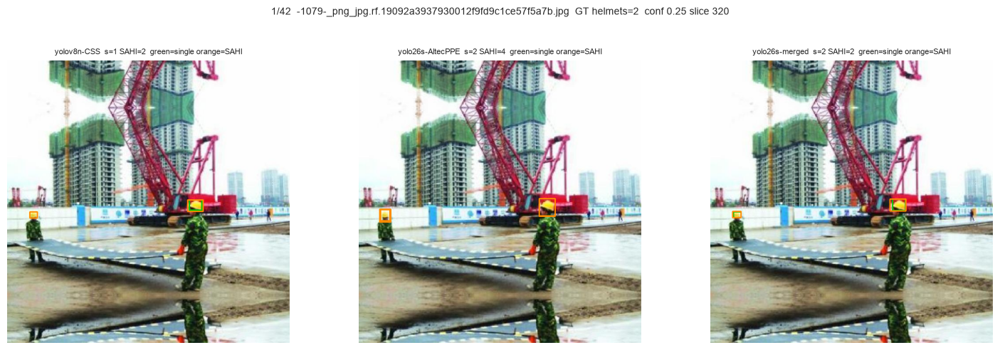

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


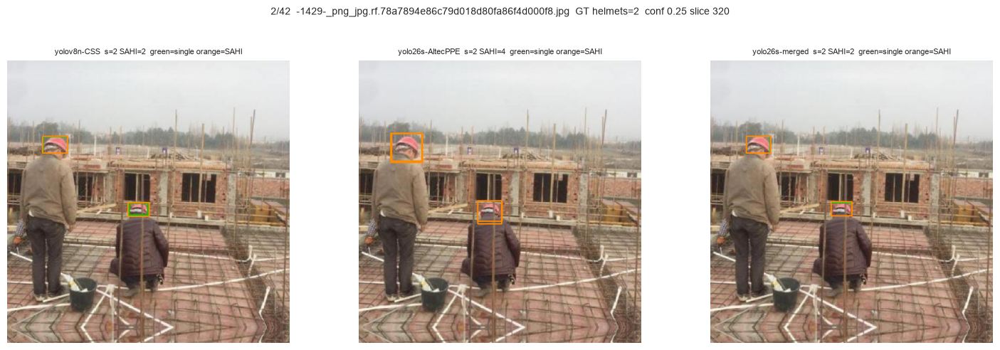

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


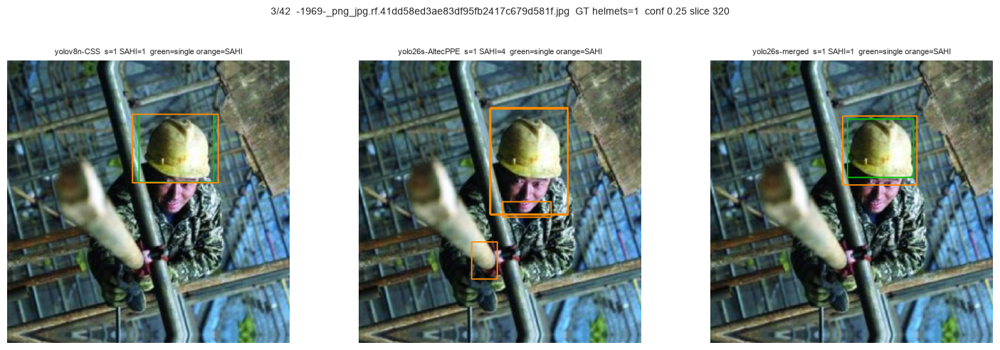

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


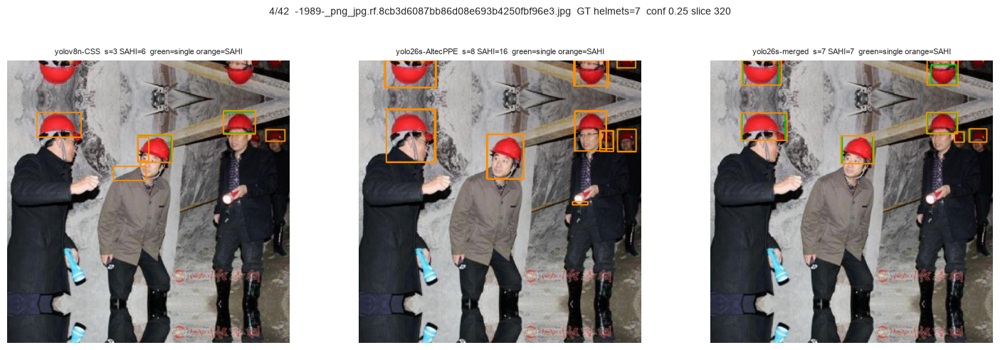

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


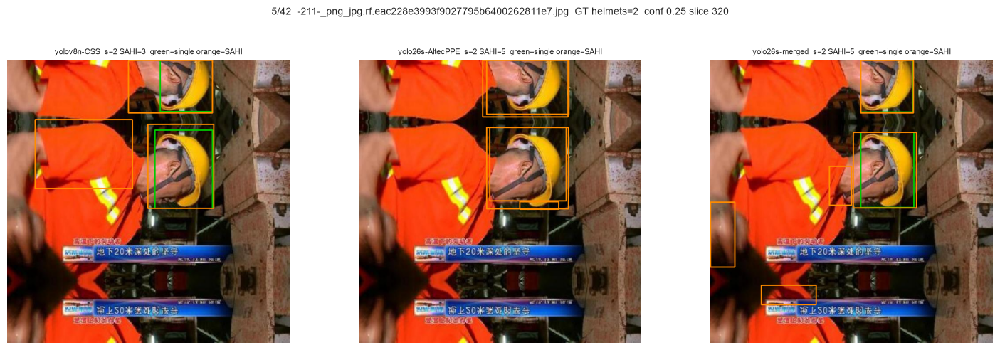

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


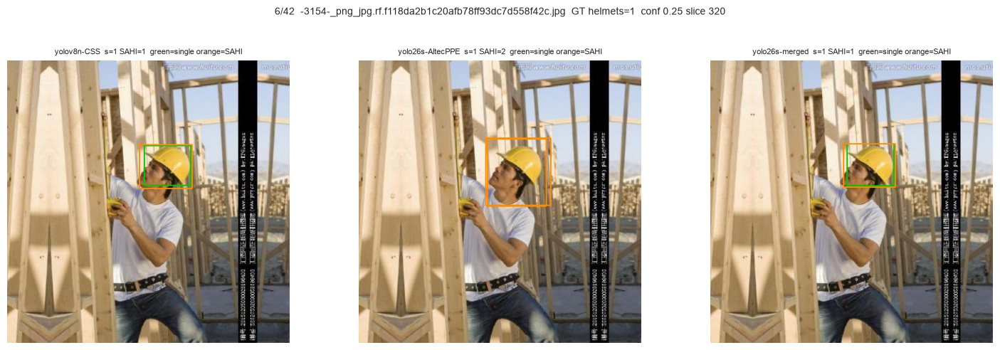

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


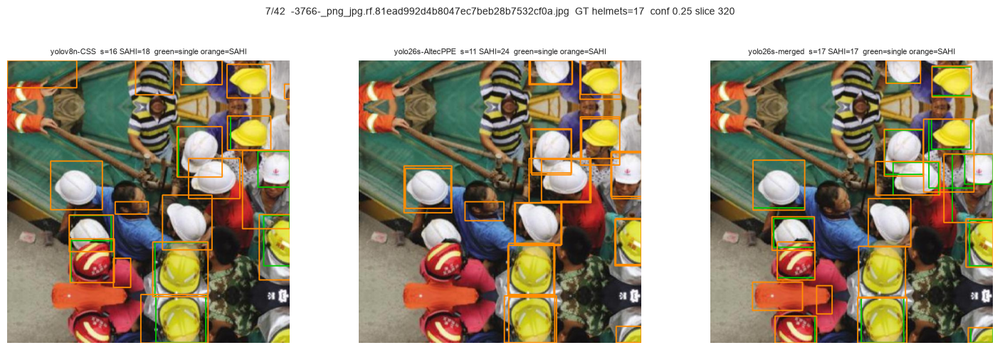

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


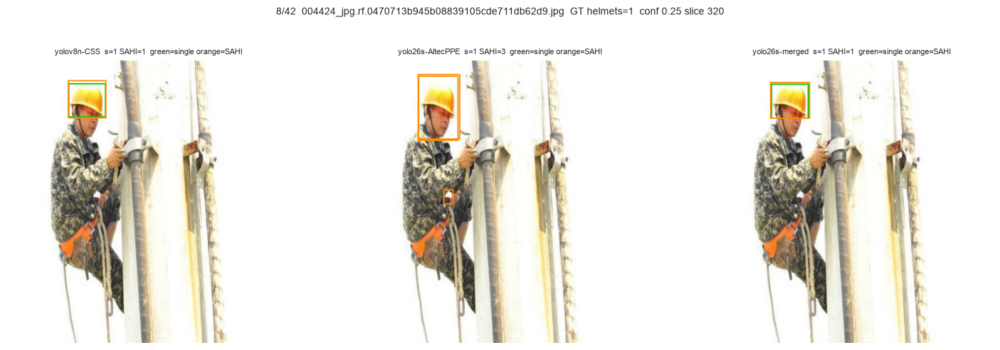

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


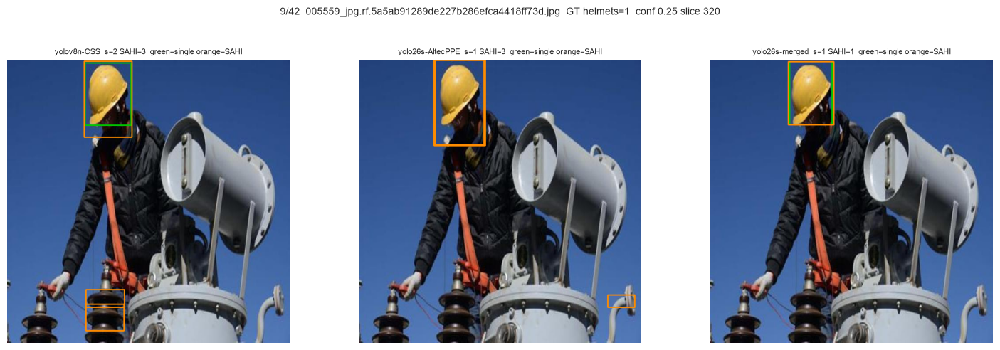

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


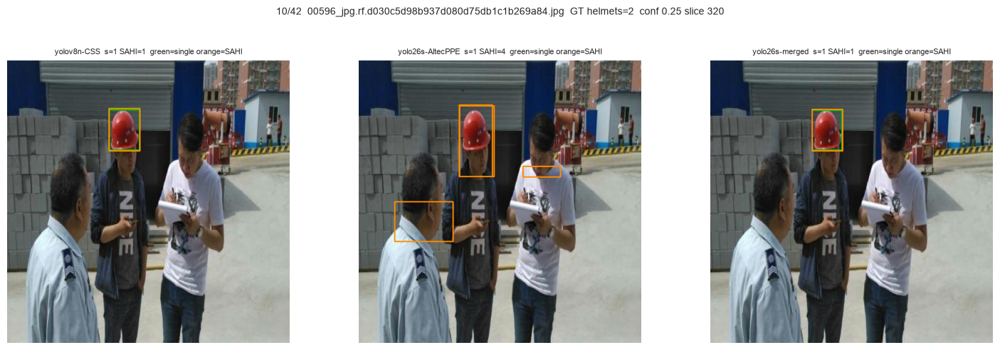

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


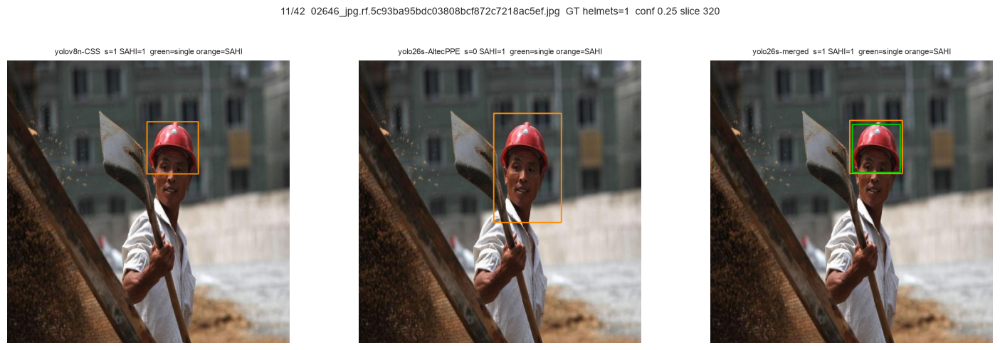

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


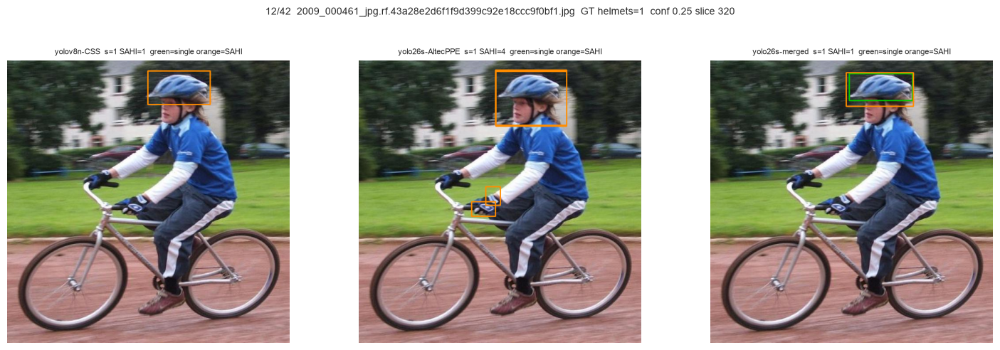

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


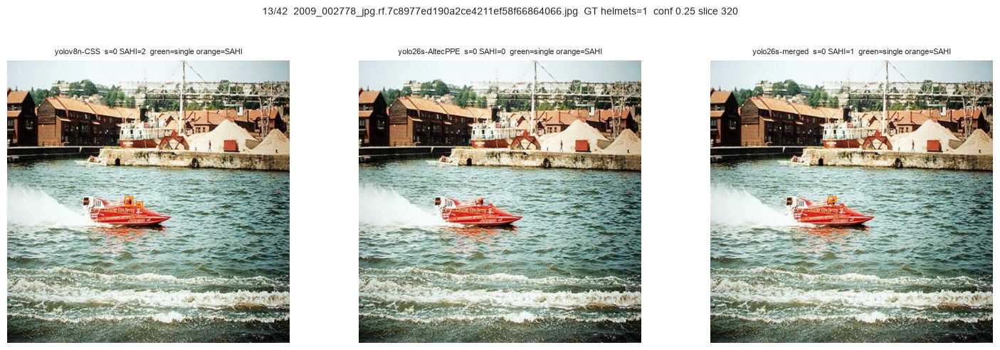

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


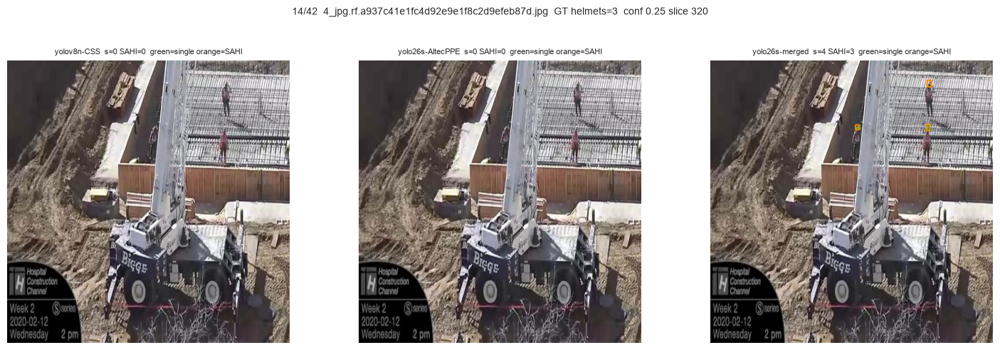

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


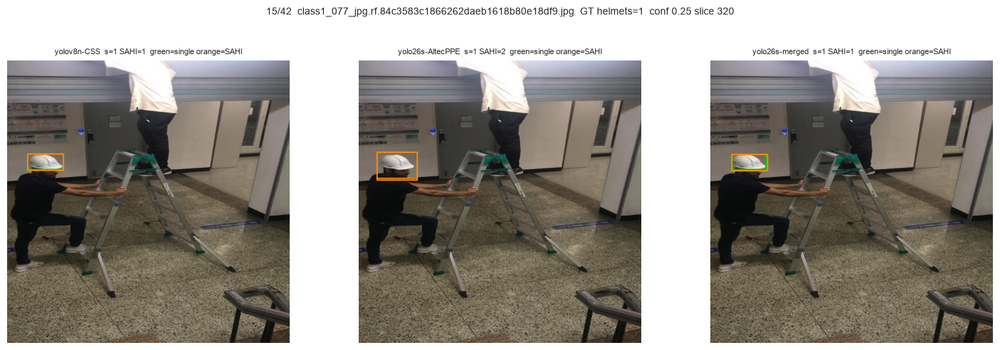

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


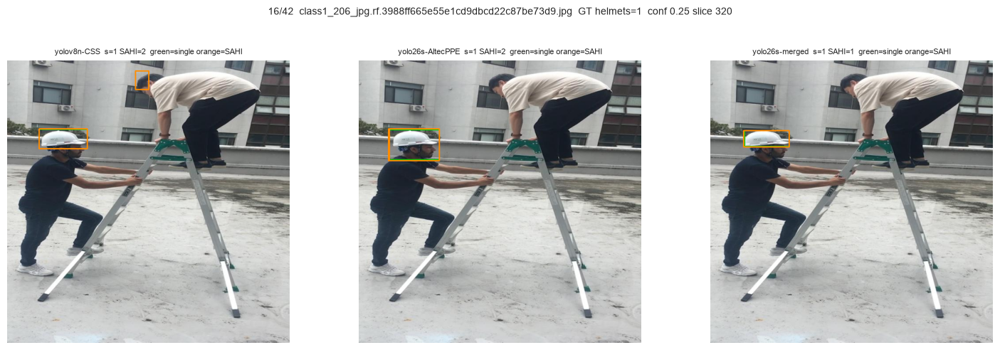

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


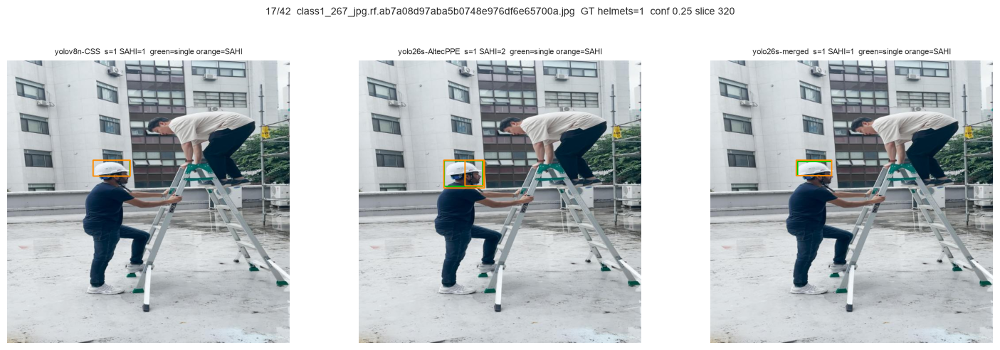

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


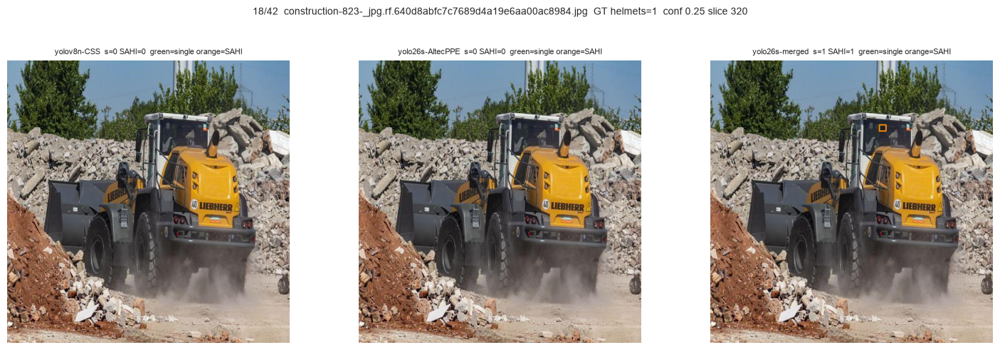

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


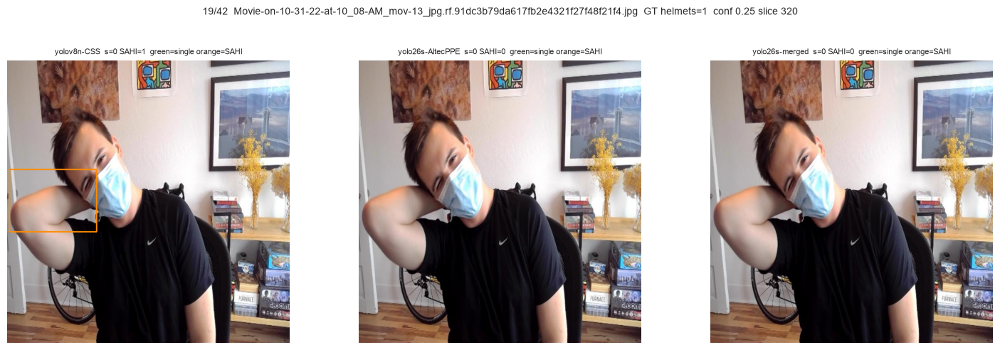

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


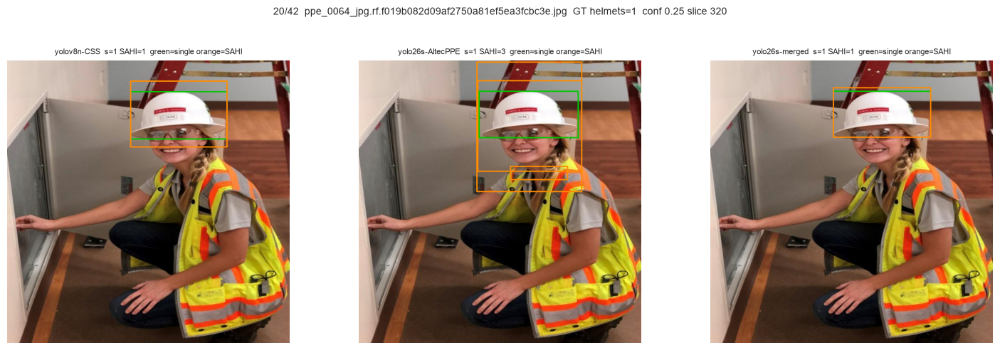

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


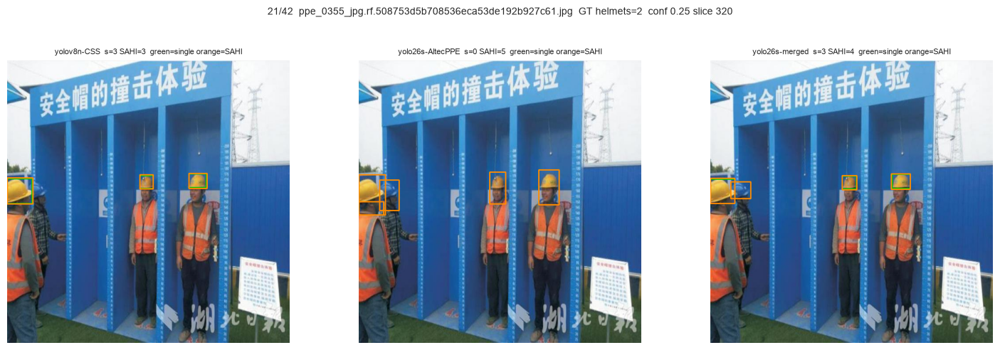

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


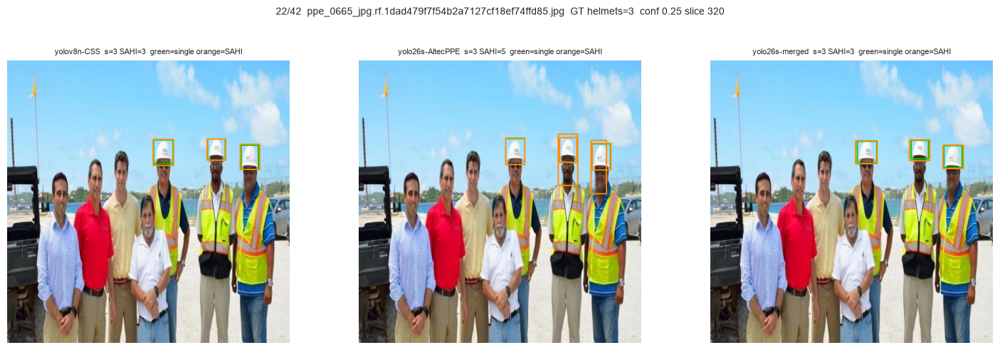

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


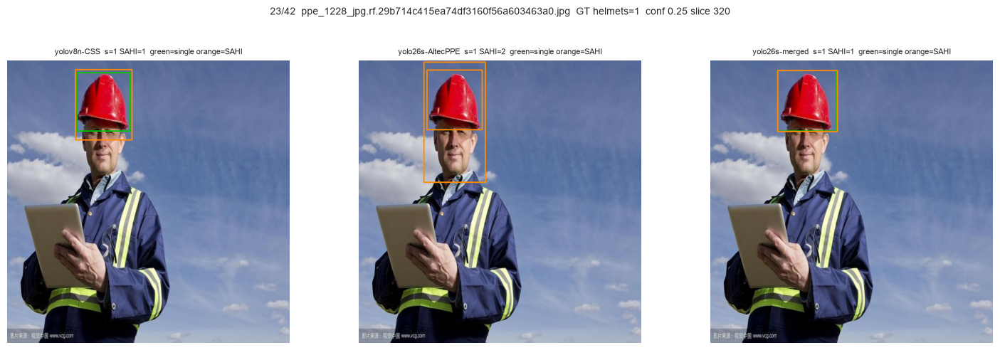

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


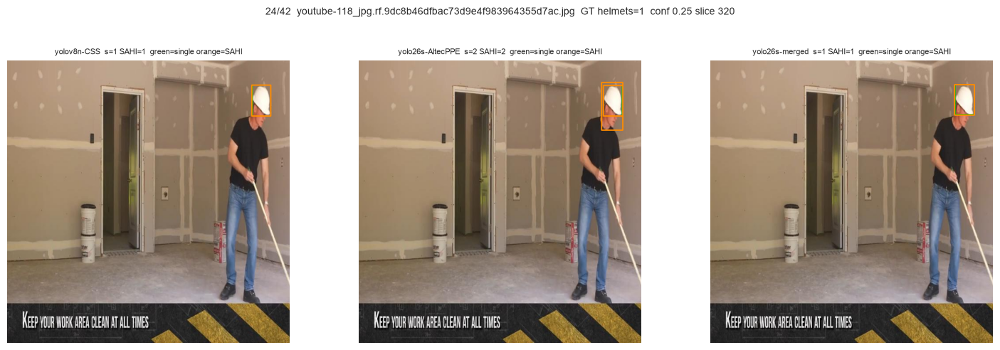

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


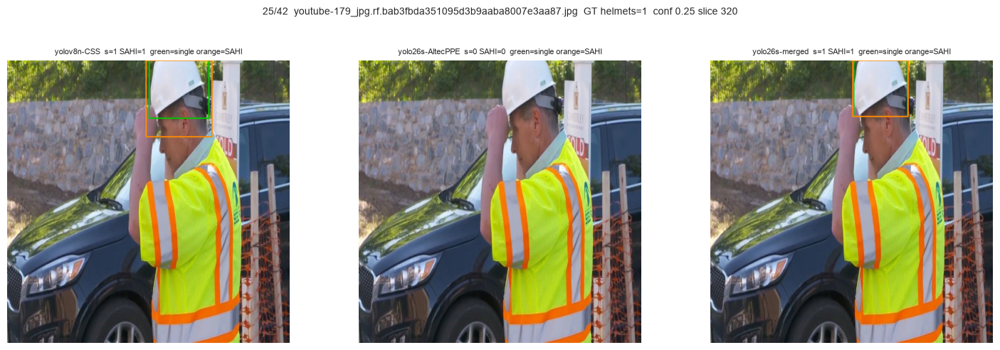

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


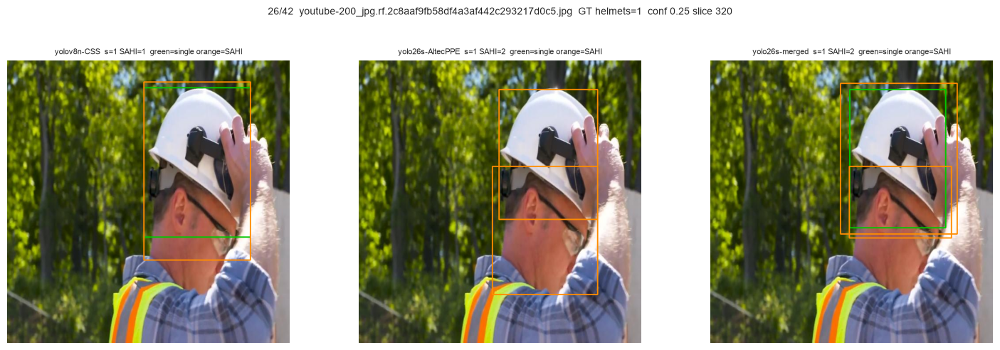

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


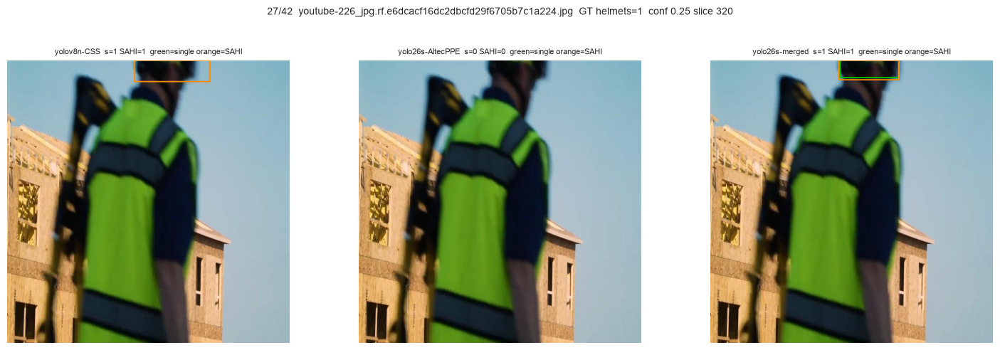

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


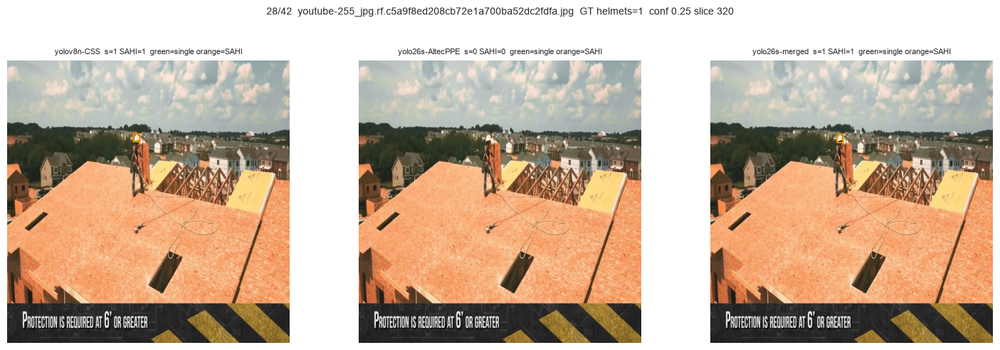

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


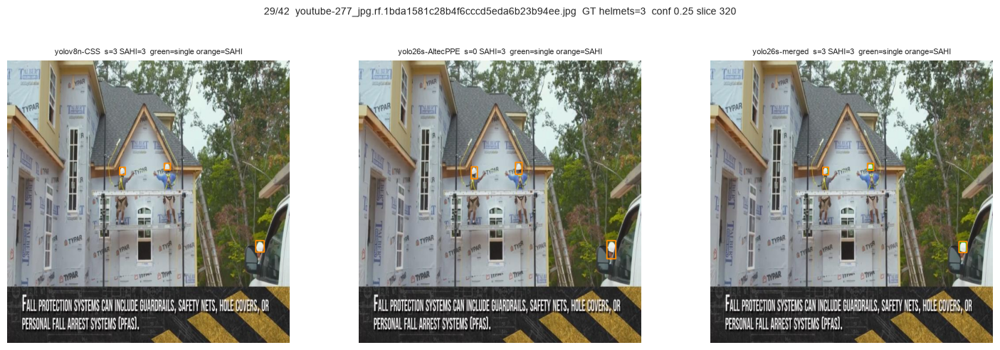

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


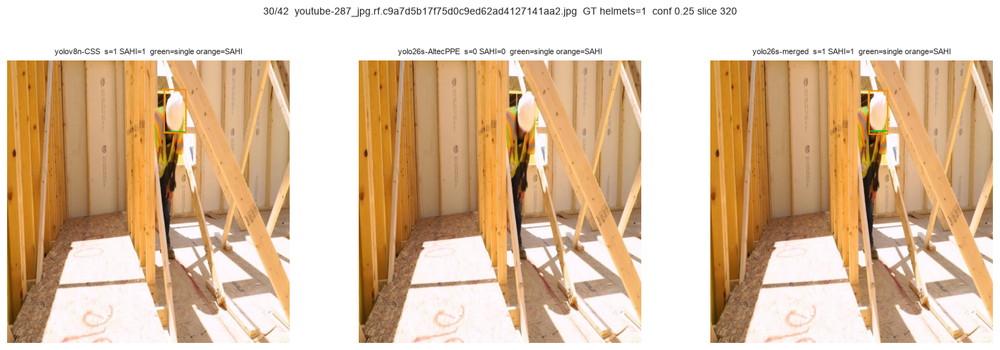

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


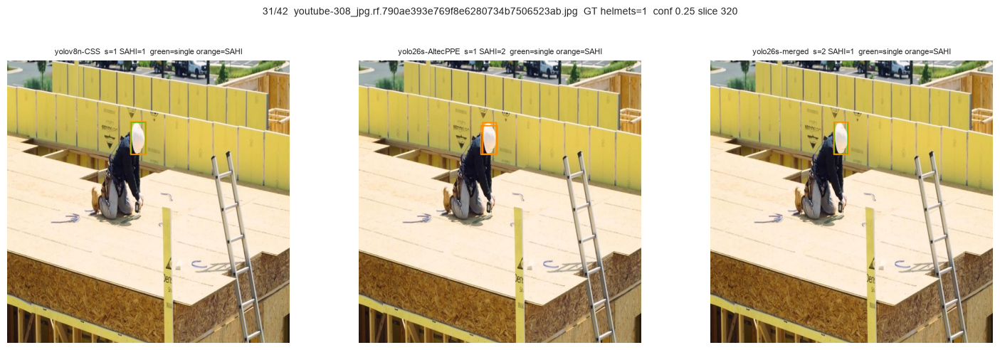

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


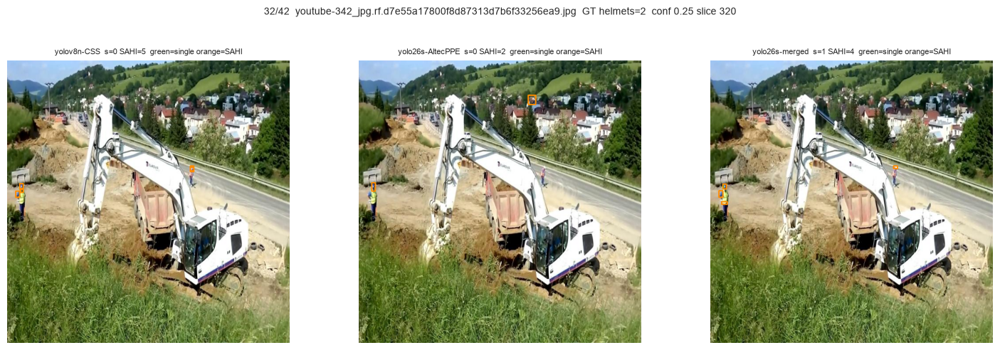

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


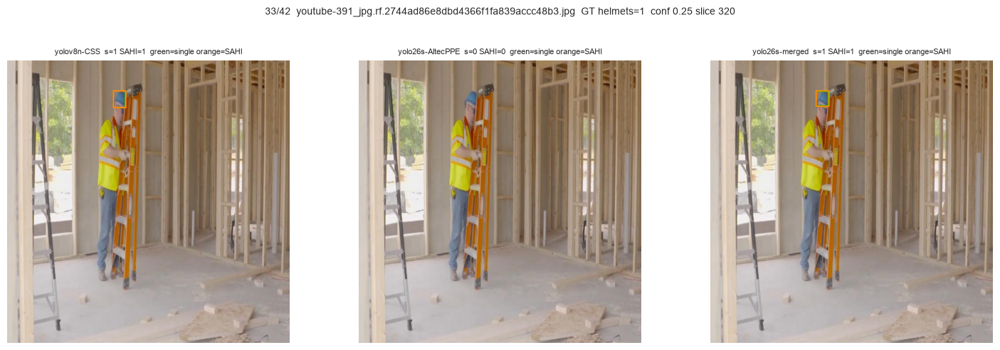

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


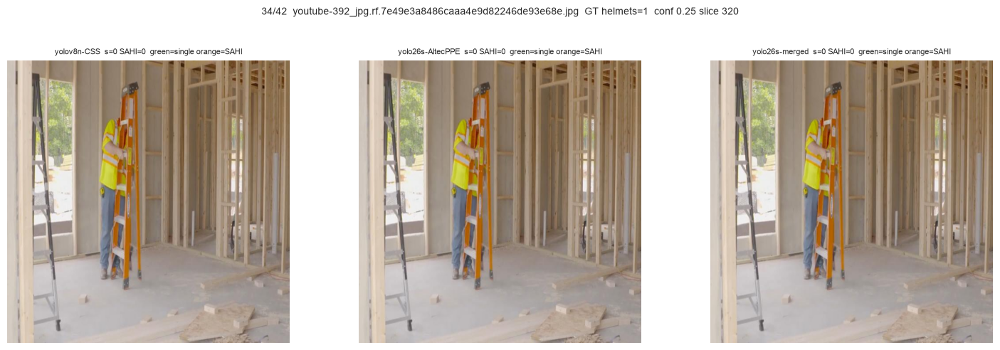

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


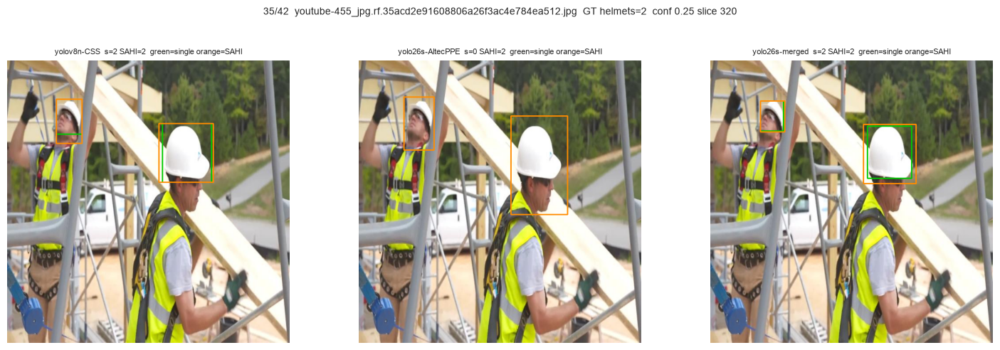

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


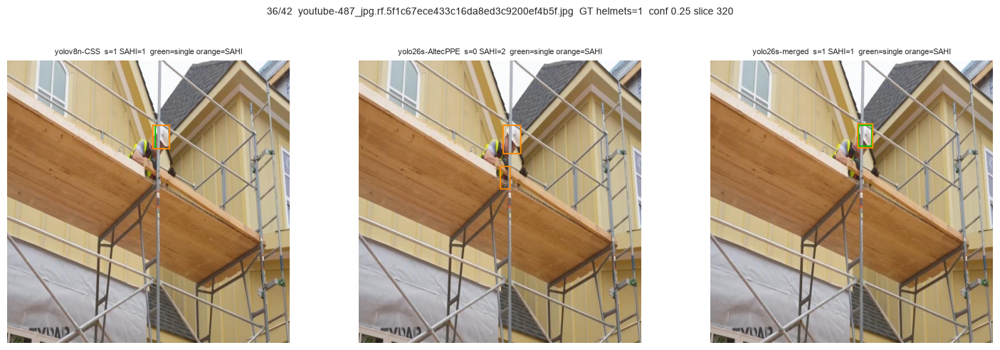

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


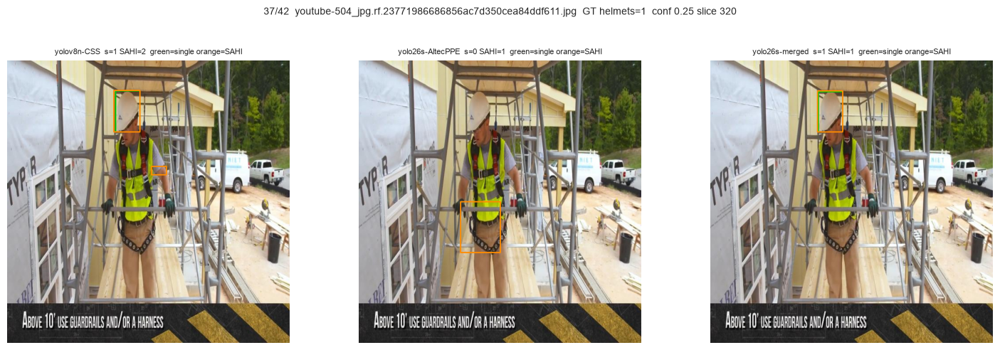

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


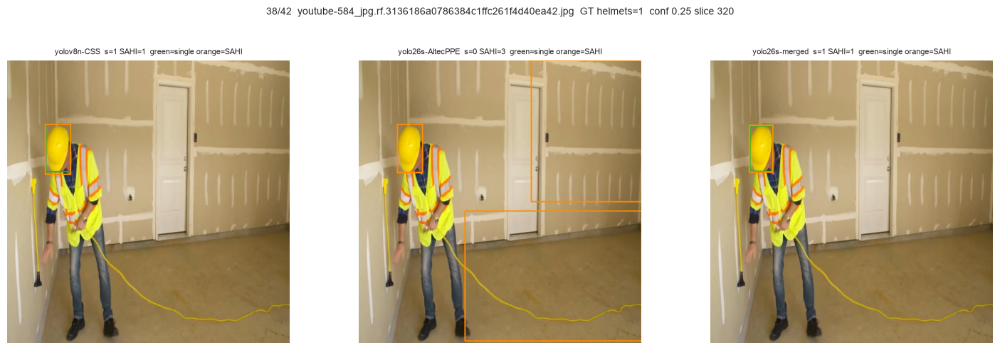

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


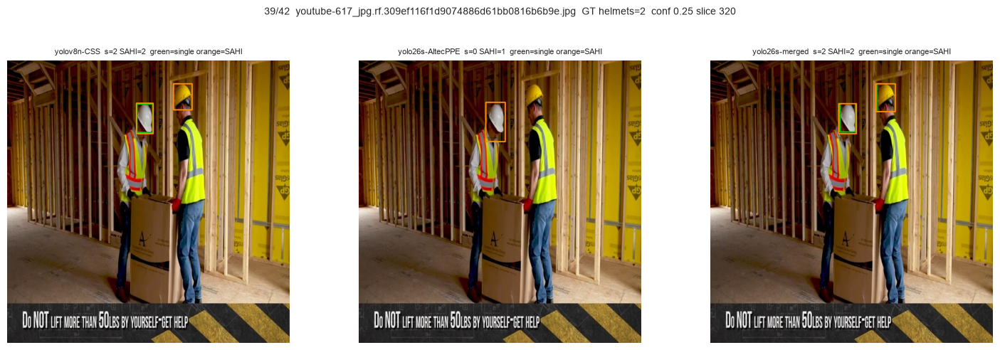

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


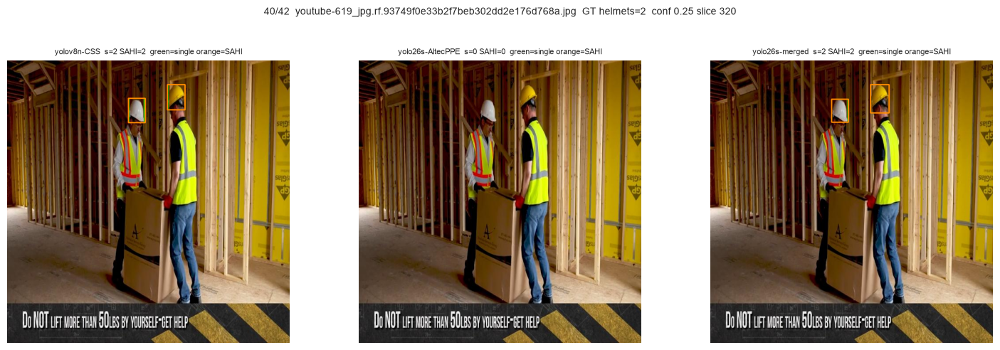

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


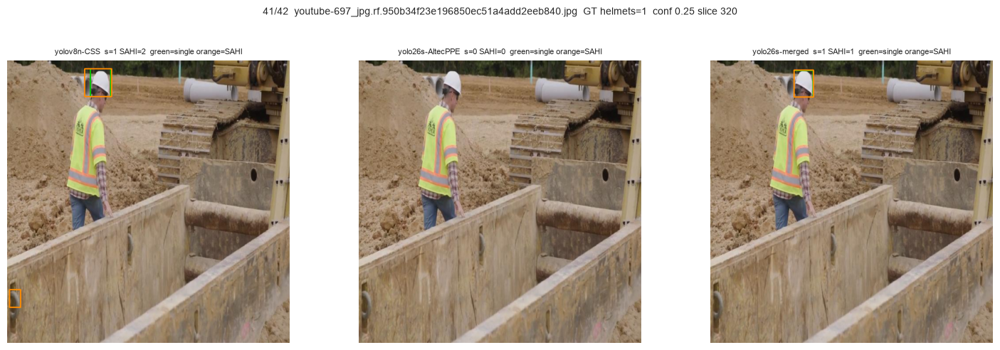

Performing prediction on 9 slices.
Performing prediction on 9 slices.
Performing prediction on 9 slices.


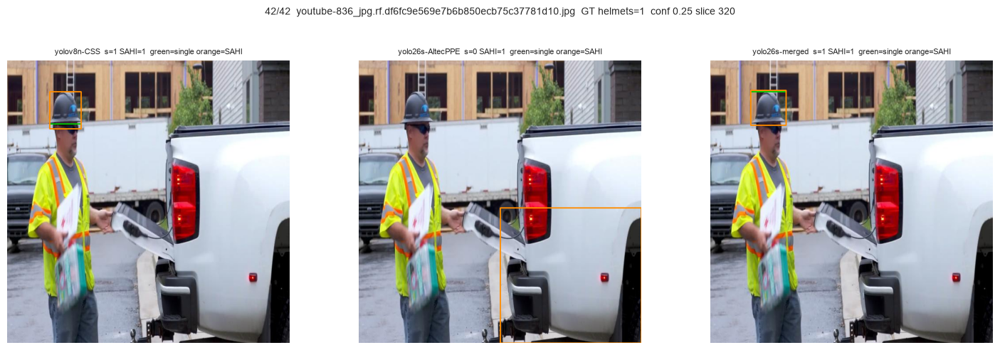

In [55]:
if not IMGS:
    print('no images')
else:
    helmet_imgs = []
    for im in IMGS:
        lab = VALID_DIR / 'labels' / (im.stem + '.txt')
        if lab.exists():
            for line in lab.read_text().splitlines():
                if line.strip() and int(float(line.split()[0])) == 0:
                    helmet_imgs.append(im)
                    break
    print(f'helmet images: {len(helmet_imgs)}/{len(IMGS)} (valid) -> {len(helmet_imgs)} figures')
    if not helmet_imgs:
        print('no helmet images found')
    else:
        yolos = {name: YOLO(str(w)) for name, w, _ in MODELS}
        sahis = {name: get_model(w, CONF) for name, w, _ in MODELS}
        for idx, im in enumerate(helmet_imgs, 1):
            with Image.open(im) as pil:
                base = __import__("numpy").array(pil)
            lab = VALID_DIR / 'labels' / (im.stem + '.txt')
            gt_n = sum(1 for l in lab.read_text().splitlines() if l.strip() and int(float(l.split()[0]))==0) if lab.exists() else 0
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            fig.suptitle(f'{idx}/42  {im.name}  GT helmets={gt_n}  conf {CONF} slice {SLICE}', fontsize=10)
            for ax, (name, weight, keep) in zip(axes, MODELS):
                yolo = yolos[name]; sm = sahis[name]
                r = yolo(str(im), verbose=False, conf=CONF)[0]
                single = []
                if r.boxes is not None:
                    for i in range(len(r.boxes)):
                        if int(r.boxes.cls[i].item()) in keep:
                            x1,y1,x2,y2 = r.boxes.xyxy[i].tolist(); single.append([x1,y1,x2,y2])
                res = get_sliced_prediction(str(im), sm, slice_height=SLICE, slice_width=SLICE, overlap_height_ratio=OVERLAP, overlap_width_ratio=OVERLAP, perform_standard_pred=True)
                sahi_b = [[pr.bbox.minx, pr.bbox.miny, pr.bbox.maxx, pr.bbox.maxy] for pr in res.object_prediction_list if int(pr.category.id) in keep]
                vis = base.copy()
                for x1,y1,x2,y2 in single: cv2.rectangle(vis,(int(x1),int(y1)),(int(x2),int(y2)),(0,200,0),2)
                for x1,y1,x2,y2 in sahi_b: cv2.rectangle(vis,(int(x1),int(y1)),(int(x2),int(y2)),(255,140,0),2)
                ax.imshow(vis)
                ttl = f'{name}  s={len(single)} SAHI={len(sahi_b)}'
                ax.set_title(ttl + '  green=single orange=SAHI', fontsize=8)
                ax.axis('off')
            plt.tight_layout(rect=[0,0,1,0.93]); plt.show()
